<a href="https://colab.research.google.com/github/avichalsri/Final-year/blob/main/FinalYearProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install easyocr

     |████████████████████████████████| 63.2MB 65kB/s 


In [ ]:
import matplotlib.pyplot as plt                     #For showing rectangle boxes in text detection
import cv2                                          #For image reading and processing
import easyocr                                      #For test extraction
from pylab import rcParams                          #Matplotlib function to set default figure size
from IPython.display import Image                   #Display Image
from PIL import Image as Image2                     #Used for increasing quality function {PIL: Python Imaging Library}
from google.colab.patches import cv2_imshow         #Display OpenCV Image

In [ ]:
rcParams['figure.figsize'] = 8, 16                  #Setting default figure length and width

In [ ]:
reader = easyocr.Reader(['en', 'hi'])               #Downloading Language Readers

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


In [ ]:
imgfile = "hindi1.jpg"                                  #Setting Image location

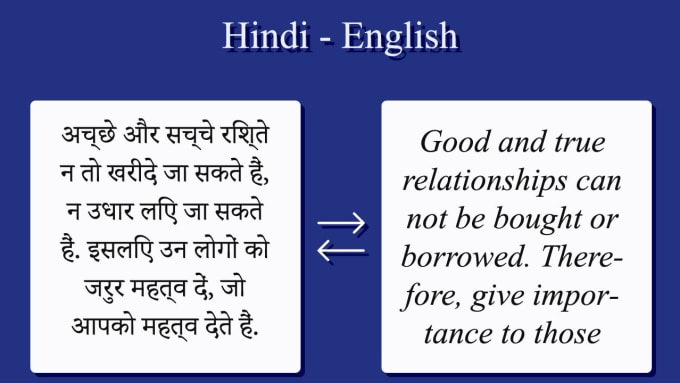

In [ ]:
Image(imgfile)

In [ ]:
newfile=Image2.open(imgfile)
newfile.save("processed.jpg", quality=95)          #Increasing image quality to 95% for better processing

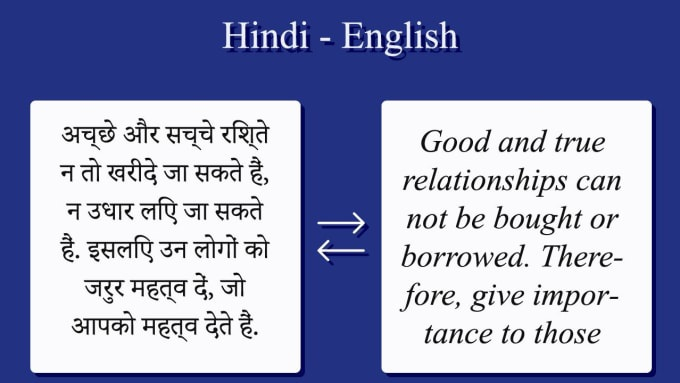

In [ ]:
newimage='processed.jpg'
Image(newimage)

In [ ]:
cvimg=cv2.imread(newimage)                          #Converting image to OpenCV Image

In [ ]:
img = cv2.cvtColor(cvimg, cv2.COLOR_BGR2GRAY)    
cv2.imwrite(r"./preprocess/img_gray.png",img)       #Applying Grayscaling smoothing

#A grayscale (or graylevel) image is simply an image in which the only colors are shades of gray. 
#The reason for differentiating such images from any other sort of color image is that less
# information needs to be provided for each pixel.

False

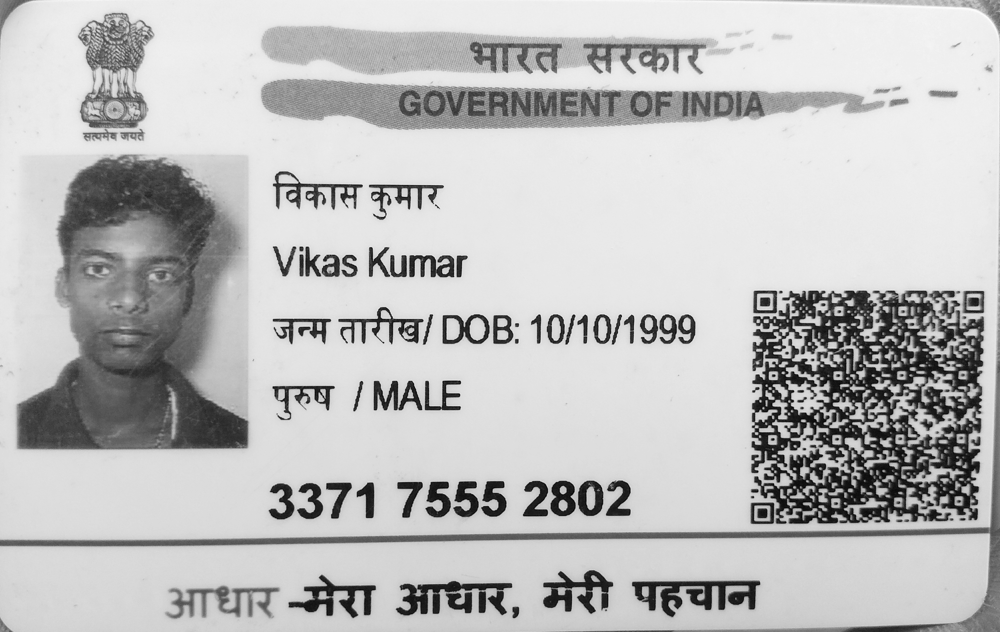

In [ ]:
cv2_imshow(img)

In [ ]:
new_img = cv2.GaussianBlur(img,(5,5),0)
cv2.imwrite(r"./preprocess/img_blur.png",img)     #Applying Blurring smoothing

#Blurring of an image removes “outlier” pixels that may be noise in the image.
#Blurring is an example of applying a low-pass filter to an image. In computer vision,
#the term “low-pass filter” applies to removing noise from an image while leaving the majority of the image intact.  

False

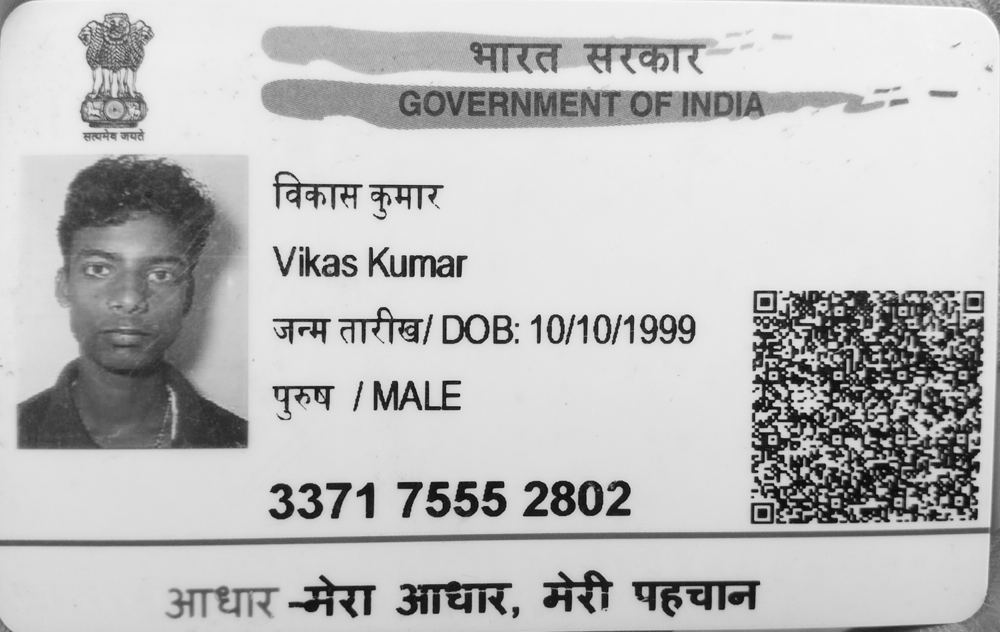

In [ ]:
cv2_imshow(new_img)

In [ ]:
new_image = cv2.threshold(new_img, 100, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY)[1]    
cv2.imwrite(r"./preprocess/img_threshold.png",img)                       #Applying Thresholding smoothing

#Image thresholding is a simple form of image segmentation. It is a way to create a binary image from a grayscale or full-color image.
#This is typically done in order to separate "object" or foreground pixels from background pixels to help in image processing.

False

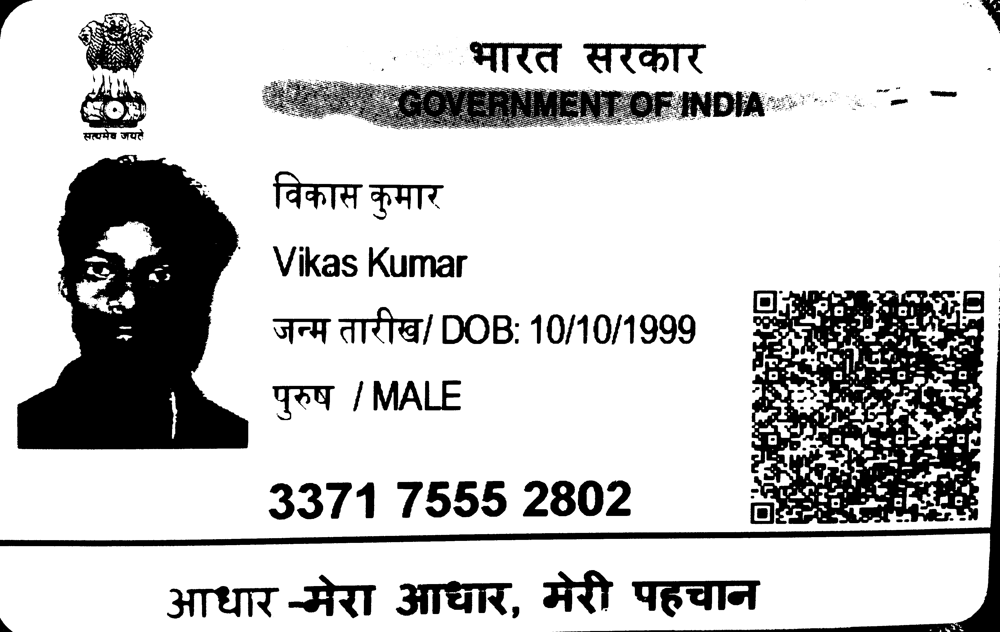

In [ ]:
cv2_imshow(new_image)

In [ ]:
#output = reader.readtext(newimage)
output=reader.readtext(newimage,paragraph=True)       

#Main Text extraction Function based on Deep learning models of Text Detection and Text Recognition.
#In the text recognition, it first detects and identifies the bounding boxes of the text present in the image or document.
#Second, it identifies the characters/words.

In [ ]:
output                                 #Trained model output

[[[[217, 14], [464, 14], [464, 62], [217, 62]], 'Hindi English'],
 [[[55, 115], [275, 115], [275, 346], [55, 346]],
  'अच्छे और सच्चे रश्ते न तो खरीदे जा सकते है न उधार लएि जा सकते है. इसलएि उन लोगों को जरुर महत्व दे, जो आपको महत्व देते है.'],
 [[[396, 126], [626, 126], [626, 350], [396, 350]],
  'Good and true relationships can not be bought or borrowed. There- fore, give impor- tance to those']]

In [ ]:
ans=[]
for ele in output:
  ans.append(ele[1])

In [ ]:
ans


['Hindi English',
 'अच्छे और सच्चे रश्ते न तो खरीदे जा सकते है न उधार लएि जा सकते है. इसलएि उन लोगों को जरुर महत्व दे, जो आपको महत्व देते है.',
 'Good and true relationships can not be bought or borrowed. There- fore, give impor- tance to those']

In [ ]:
dim=[]
for ele in output:
  dim.append(ele[0])


In [ ]:
dim


[[[217, 14], [464, 14], [464, 62], [217, 62]],
 [[55, 115], [275, 115], [275, 346], [55, 346]],
 [[396, 126], [626, 126], [626, 350], [396, 350]]]

Hindi English
अच्छे और सच्चे रश्ते न तो खरीदे जा सकते है न उधार लएि जा सकते है. इसलएि उन लोगों को जरुर महत्व दे, जो आपको महत्व देते है.
Good and true relationships can not be bought or borrowed. There- fore, give impor- tance to those


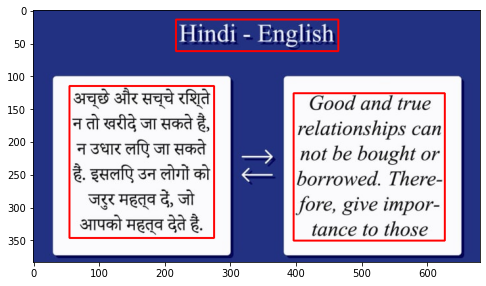

In [ ]:
image = cv2.imread(newimage)
for cord in dim:
  x_min, y_min = [int(min(idx)) for idx in zip(*cord)]
  x_max, y_max = [int(max(idx)) for idx in zip(*cord)]
  cv2.rectangle(image,(x_min,y_min),(x_max,y_max),(0,0,255),2)      #Enclose Text in rectangular boxes
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
# for i in range(0,len(ans),3):
#   print(ans[i],end=" ")
#   if(i+1<len(ans)):
#     print(ans[i+1],end=" ")
#   if(i+2<len(ans)):
#     print(ans[i+2])
for ele in ans:
  print(ele)
